In [1]:
import sys, os
import ujson as json
from pathlib import Path 
HOME = "/rds/general/user/dl2119/home/ICLR_Interp" # Path(os.environ["PATH_INTP_FOLDER"])
os.environ["PATH_INTP_FOLDER"] = HOME
HOME = Path(HOME)
sys.path.append(str(HOME))
sys.path.append(str(HOME / "DataGeneration"))
sys.path.append(str(HOME / "ModelGeneration"))
sys.path.append(str(HOME / "ModelGeneration" / "DelaunaySparse"))
sys.path.append(str(HOME / "ModelComparison"))


import pandas as pd 
import jax.random as jrandom
from scipy.interpolate import RBFInterpolator
import jax.numpy as jnp
import numpy as np

from ModelComparison import get_rbf_tags
from save_load_data import load_fast, get_all_data_configurations
from save_load_model import save_nn, get_all_net_tags
from save_load_comps import load_all_comps
from nn_train import train
from DataAnalysis import curv

from vis_utils import get_line_along_v, get_constrained_plane_along_uv


from chart_studio import plotly as py
import plotly.graph_objs as go

import torch
import torchvision
import torch.optim as optim
from torch import Tensor

import torch.nn as nn
from torch.nn import Module

from torch.utils.data import DataLoader

import matplotlib.pyplot as plt 
from save_load_model import fast_load_nn, get_nn_tag



from Functions import get_func
import numpy as np

%load_ext autoreload
%autoreload 2

In [2]:
import sys, os
import ujson as json
from pathlib import Path 

HOME = "/rds/general/user/dl2119/home/ICLR_Interp" # Path(os.environ["PATH_INTP_FOLDER"])
os.environ["PATH_INTP_FOLDER"] = HOME
HOME = Path(HOME)
sys.path.append(str(HOME))
sys.path.append(str(HOME / "DataGeneration"))
sys.path.append(str(HOME / "ModelGeneration"))
sys.path.append(str(HOME / "ModelComparison"))
sys.path.append(str(HOME / "DelaunaySparse"))


from torch import Tensor
from scipy.interpolate import RBFInterpolator, interp1d
import numpy as np

from save_load_data import load_fast, get_all_data_configurations
from save_load_model import fast_load_nn, get_nn_tag
from save_load_comps import undo_model_tag
from DelaunaySparse.delsparse import delaunay_approx


class GModel():

    def __init__(self, func_name, dim, N, data_gen_method, model):
        
        X_train, y_train = load_fast(func_name, dim, N, data_gen_method)
        
        self.func_name = func_name
        self.dim = dim
        self.N = N
        self.data_gen_method = data_gen_method


        self._x_max, self._x_min = np.max(X_train), np.min(X_train)
        self._y_max, self._y_min = np.max(y_train), np.min(y_train)

        self._model = self._get_model(X_train, y_train, model)
        
        
    def f(self, X):
#         return self._model(X)
        X = (X - (self._x_max + self._x_min)/2.) * 5. / ((self._x_max - self._x_min)/2.)
        out = self._model(X)
        return out * (((self._y_max - self._y_min)/2.) / 5.) + (self._y_max + self._y_min)/2.
    
    def train_error(self):
        if self.tag_dict['model'] == "rbf":
            return 0.
        
        else:
            X_train, y_train = load_fast(self.func_name, self.dim, self.N, self.data_gen_method)
            out = self.f(X_train)
            return jnp.mean((y_train - out)**2) # * (5. / ((self._y_max - self._y_min)/2.))**2 uncomment to get loss as given during training. 
            
    
    def _get_model(self, X_train, y_train, model):
        X_train = (X_train - (self._x_max + self._x_min)/2.) * 5. / ((self._x_max - self._x_min)/2.)
        y_train = (y_train - (self._y_max + self._y_min)/2.) * 5. / ((self._y_max - self._y_min)/2.)
        
        net = model

        return lambda X: net(Tensor(X)).detach().numpy().ravel()


In [3]:
def normalize(X_data, y_data):
    x_max, x_min = np.max(X_data), np.min(X_data)
    y_max, y_min = np.max(y_data), np.min(y_data)
    X_data = (X_data - (x_max + x_min)/2.) * 5. / ((x_max - x_min)/2.)
    y_data = (y_data - (y_max + y_min)/2.) * 5. / ((y_max - y_min)/2.)

    return X_data, y_data

In [30]:

func_name = "Rasti"
dim = 2
N = 12

F = get_func(func_name)
data_gen_method = "MeshSimplify" # UniformGrid Reparam_curv_useNorm_True UniformRandom





In [32]:
num_epochs = int(1e4)
eps = 1e-8
width = 32
depth = 2
optimizer = "Adam" # "SGD"
lr = 1e-3
batch_size = 8
weight_decay = 0 # 5e-4
momentum = 0

res_train = 0
res_test = 0

X_data, y_data = load_fast(func_name, dim, N**dim, data_gen_method)
X_train, y_train = normalize(X_data, y_data)

X_test = np.linspace(F.bounds[0][0], F.bounds[0][1], 200).reshape(-1, 1)
XY = np.meshgrid(X_test, X_test)
X_test = np.array([XY[0].ravel(), XY[1].ravel()]).T

y_test = F.f(X_test)



res = [np.zeros(2) for _ in range(4)]

net = None
for _ in range(5):
    for i, delta_run in enumerate([100, 400, 500, 1000]):
    
        net, loss_hist = train(dim, net, X_train, y_train, delta_run, eps, width, depth, optimizer, lr, batch_size, weight_decay, momentum, verbose=True)

        gmodel = GModel(func_name, dim, N**dim, data_gen_method, net)

        res[i] += np.array([np.mean((gmodel.f(X_data) - y_data)**2), np.mean((gmodel.f(X_test) - y_test)**2)])
    
print(np.array(res)/4.)


100%|██████████| 1000/1000 [00:11<00:00, 86.82it/s]

[[ 65.10584834 142.84829559]
 [ 48.42979022 140.92828161]
 [ 37.46080867 142.25685859]
 [ 25.17484521 149.11012795]]


In [29]:
print(np.array(res)/4.)



[[24.18630392 26.50089231]
 [22.98780899 25.25849141]
 [21.66043396 24.14961368]
 [10.89405042 17.35864439]]


0.0014033167907554242


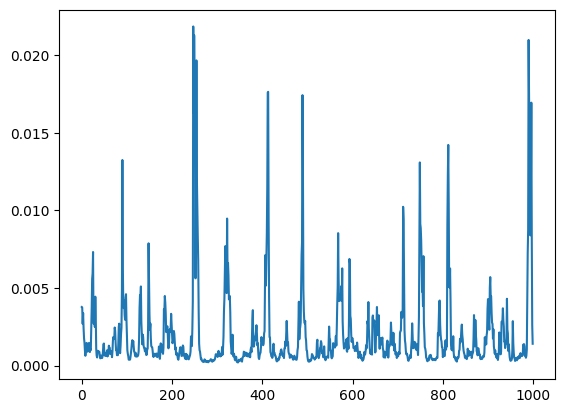

In [18]:
print(loss_hist[-1])
plt.plot(loss_hist)

In [385]:
gmodel = GModel(func_name, dim, N**dim, data_gen_method, net)

In [35]:
if dim == 1:
    X_test = np.linspace(F.bounds[0][0], F.bounds[0][1], 500).reshape(-1, 1)
else:
    X_test = np.linspace(F.bounds[0][0], F.bounds[0][1], 200).reshape(-1, 1)
    XY = np.meshgrid(X_test, X_test)
    X_test = np.array([XY[0].ravel(), XY[1].ravel()]).T

y_test = F.f(X_test)

if dim ==1:
    plt.plot(X_test, y_test, label="true")
    plt.plot(X_test, gmodel.f(X_test), label="nn")
    plt.scatter(X_data, y_data, label="points given")
    plt.legend()
    plt.show()

else:
    z_model = gmodel.f(X_test)
    z_true = F.f(X_test)
    
    
    fig = go.Figure(data=[go.Mesh3d(x = X_test.T[0], y = X_test.T[1], z = z_model, opacity=0.7, name="model"),
                         go.Mesh3d(x = X_test.T[0], y = X_test.T[1], z = z_true, opacity=0.2, name="true"),
                         go.Scatter3d(x=X_data[:, 0], y=X_data[:, 1], z=y_data, opacity=0.9, mode='markers')])
    
#     fig.update_layout(showlegend=True)
    fig.show()
    
    
print(np.mean((gmodel.f(X_test) - y_test)**2))

130.96178143719658


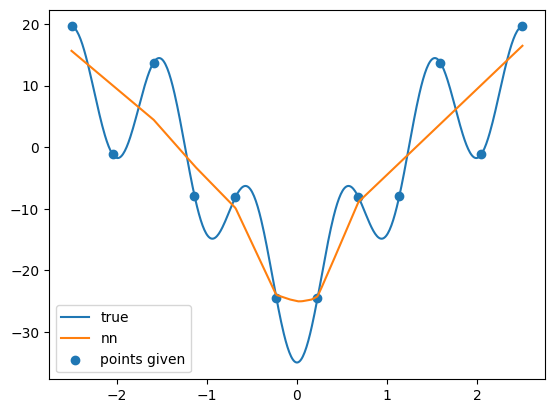

In [132]:
if dim == 1:
    X_test = np.linspace(F.bounds[0][0], F.bounds[0][1], 500).reshape(-1, 1)
else:
    X_test = np.linspace(F.bounds[0][0], F.bounds[0][1], 200).reshape(-1, 1)
    XY = np.meshgrid(X_test, X_test)
    X_test = np.array([XY[0].ravel(), XY[1].ravel()]).T
    
y_test = F.f(X_test)

plt.plot(X_test, y_test, label="true")
plt.plot(X_test, gmodel.f(X_test), label="nn")
plt.scatter(X_data, y_data, label="points given")
plt.legend()
plt.show()